(Bayesian Vector Autoregressive Models)=
# Bayesian Vector Autoregressive Models

:::{post} Oct, 2022
:tags: time series, VARs 
:category: intermediate
:author: Ricardo Vieira, Nathaniel Forde
:::

In [366]:
import arviz as az
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import statsmodels.api as sm
import aesara as at

In [2]:
RANDOM_SEED = 8927
rng = np.random.default_rng(RANDOM_SEED)
az.style.use("arviz-darkgrid")
%config InlineBackend.figure_format = 'retina'

# Bayesian Hierarchical GDP

In this notebook we will outline an application of the Bayesian Vector Autoregressive Modelling. We will draw on the work in the PYMC Labs blogpost and other work by Jesse Grabowski. We want to show how to fit a hierarchical bayesian VAR model in PYMC. We will demonstrate the basic pattern on a simple VAR model and then add in the complexity of modelling the hierarchical parameters which govern the individual timeseries. We will show case the basic functionality of VAR model on fake fata with a known data generating model, and apply the hierarchical model to more typical macro economic timeseries data. 


In [508]:
def simulate_var(intercepts, coefs_yy, coefs_xy, coefs_xx, coefs_yx, noises=(1, 1), *, warmup=100, steps=200):
    draws_y = np.zeros(warmup+steps)
    draws_x = np.zeros(warmup+steps)
    draws_y[:2] = intercepts[0]
    draws_x[:2] = intercepts[1]
    for step in range(2, warmup+steps):
        draws_y[step] = (
            intercepts[0]
            + coefs_yy[0] * draws_y[step-1]
            + coefs_yy[1] * draws_y[step-2]
            + coefs_xy[0] * draws_x[step-1]
            + coefs_xy[1] * draws_x[step-2]
            + rng.normal(0, noises[0])
        )
        draws_x[step] = (
            intercepts[1]
            + coefs_xx[0] * draws_x[step-1]
            + coefs_xx[1] * draws_x[step-2]
            + coefs_yx[0] * draws_y[step-1]
            + coefs_yx[1] * draws_y[step-2]
            + rng.normal(0, noises[1])
        )
    return draws_y[warmup:], draws_x[warmup:]

## Generate Fake VAR data

In [517]:
var_y, var_x = simulate_var(
    intercepts=(18, 8),
    coefs_yy=(-0.8, 0),
    coefs_xy=(0.9, 0),
    coefs_xx=(1.3, -0.7),
    coefs_yx=(-0.1, 0.3),
)

df = pd.DataFrame({'x': var_x, 'y': var_y})
df

,x,y
0,35.755567,28.523621
1,35.284106,27.725480
2,34.349966,29.475989
3,33.179609,23.655624
4,34.517479,29.556294
...,...,...
195,34.023520,26.104873
196,34.248960,28.330898
197,34.286002,26.162559
198,32.559745,27.093902


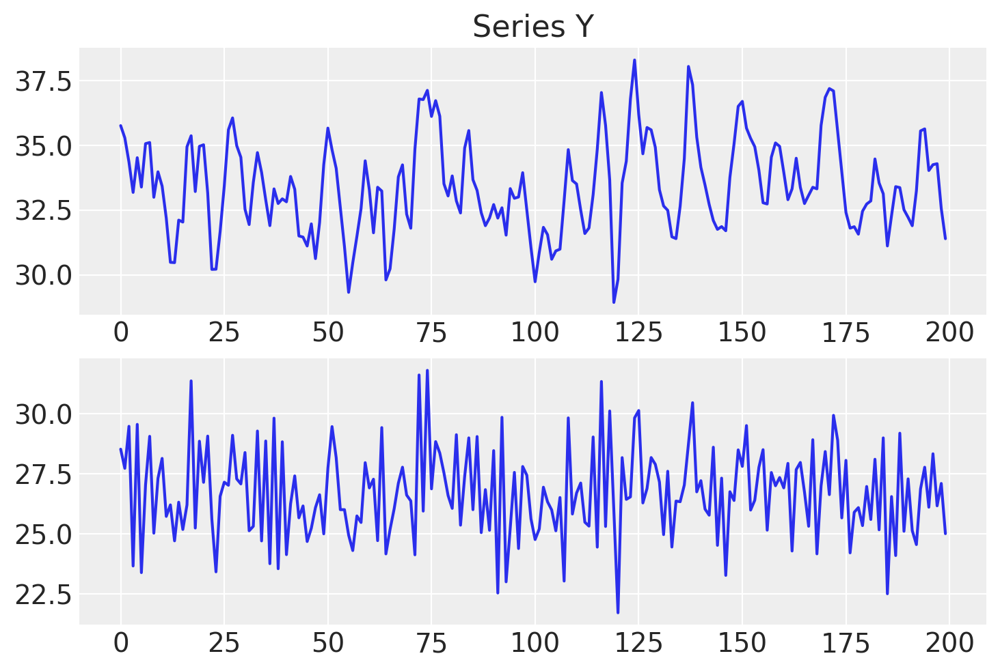

In [974]:
fig, axs = plt.subplots(2, 1)
axs[0].plot(df['x'], label='x')
axs[0].set_title("Series X")
axs[1].plot(df['y'], label='y')
axs[0].set_title("Series Y");

## Macro Economic Relationships

In [970]:
gdp_hierarchical = pd.read_csv('../data/gdp_data_hierarchical_clean.csv', index_col=0)
gdp_hierarchical


,country,iso2c,iso3c,year,GDP,CONS,GFCF,dl_gdp,dl_cons,dl_gfcf,more_than_10,time
1,Australia,AU,AUS,1971,4.647670e+11,3.113170e+11,7.985100e+10,0.039217,0.040606,0.031705,True,1
2,Australia,AU,AUS,1972,4.829350e+11,3.229650e+11,8.209200e+10,0.038346,0.036732,0.027678,True,2
3,Australia,AU,AUS,1973,4.955840e+11,3.371070e+11,8.460300e+10,0.025855,0.042856,0.030129,True,3
4,Australia,AU,AUS,1974,5.159300e+11,3.556010e+11,8.821400e+10,0.040234,0.053409,0.041796,True,4
5,Australia,AU,AUS,1975,5.228210e+11,3.759000e+11,8.255900e+10,0.013268,0.055514,-0.066252,True,5
...,...,...,...,...,...,...,...,...,...,...,...,...
366,United States,US,USA,2016,1.850960e+13,1.522497e+13,3.802207e+12,0.016537,0.023425,0.021058,True,44
367,United States,US,USA,2017,1.892712e+13,1.553075e+13,3.947418e+12,0.022306,0.019885,0.037480,True,45
368,United States,US,USA,2018,1.947957e+13,1.593427e+13,4.119951e+12,0.028771,0.025650,0.042780,True,46
369,United States,US,USA,2019,1.992544e+13,1.627888e+13,4.248643e+12,0.022631,0.021396,0.030758,True,47


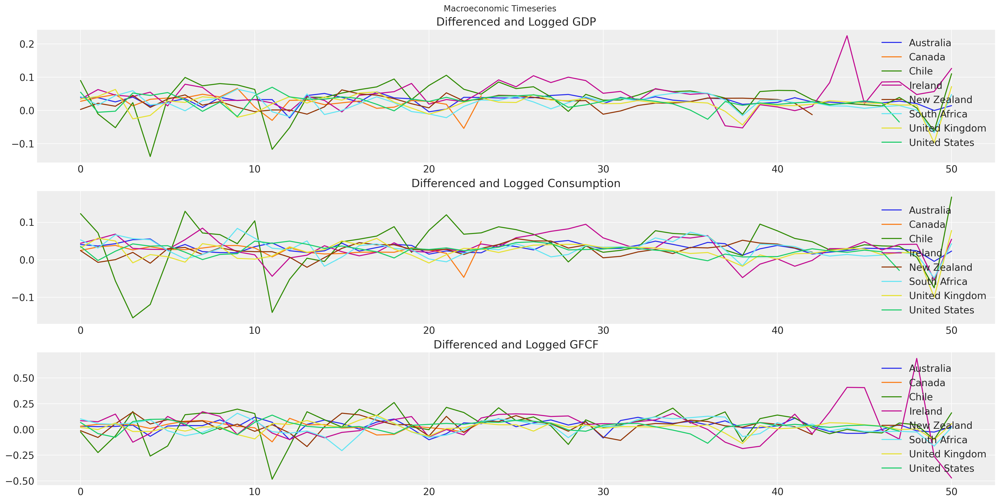

In [987]:
fig, axs = plt.subplots(3, 1, figsize=(20, 10))
for country in gdp_hierarchical['country'].unique():
    temp = gdp_hierarchical[gdp_hierarchical['country']== country].reset_index()
    axs[0].plot(temp['dl_gdp'], label=f'{country}')
    axs[1].plot(temp['dl_cons'], label=f'{country}')
    axs[2].plot(temp['dl_gfcf'], label=f'{country}')
axs[0].set_title("Differenced and Logged GDP")
axs[1].set_title("Differenced and Logged Consumption")
axs[2].set_title("Differenced and Logged GFCF")
axs[0].legend()
axs[1].legend()
axs[2].legend()
plt.suptitle("Macroeconomic Timeseries");


## Handling Multiple Lags and Different Dimensions

When Modelling multiple timeseries and accounting for potentially any number lags to incorporate in our model we need to abstract some of the model defintion to helper functions. An example will make this a bit clearer. 


In [988]:
### Set up our 2 data sets for 2 and 3 variable timeseries models respectively.
df2 = df
df3 = gdp_hierarchical[['dl_gdp', 'dl_cons', 'dl_gfcf']]

### Define a helper function that will construct our beta matrix for the marginal contribution of each lagged
### term in each of the respective time series equations
def make_beta(lag_coefs, n_eqs, n_lags, df):
    ars = []
    for j in range(n_eqs) :
        ar = pm.math.sum([
            pm.math.sum(lag_coefs[j, i] * df.values[n_lags-(i+1): -(i+1)], axis=-1)
            for i in range(n_lags)
        ], axis=0)
    ars.append(ar)
    beta = pm.math.stack(ars, axis=-1)

    return beta

### Make the model in such a way that it can handle different specifications of the likelihood term
### and can be run for simple prior predictive checks. This latter functionality is important for debugging of
### shape handling issues. Building a VAR model involves quite a few moving parts and it is handy to
### inspect the shape implied in the prior predictive checks. 
def make_model(n_lags, n_eqs, df, mv_norm=True, prior_checks=True):
    coords={"lags": np.arange(n_lags) + 1,
            "equations": df.columns.tolist(),
            "cross_vars": df.columns.tolist(),
            "time": [x for x in df.index[n_lags:]]}

    with pm.Model(coords=coords) as model:
        lag_coefs = pm.Normal("lag_coefs", mu=0, sigma=1, dims=["equations", "lags", "cross_vars"]) #filters x rows x columns
        alpha = pm.Normal("alpha", mu=10, sigma=5, dims=("equations",))
        data_obs = pm.Data('data_obs', df.values[n_lags:], dims=['time', 'equations'], mutable=True)

        beta = make_beta(lag_coefs, n_eqs, n_lags, df)
        beta = pm.Deterministic('beta', beta)
        mean = alpha + beta

        if mv_norm:
            n = df.shape[1]
            noise_chol, _, _ = pm.LKJCholeskyCov('noise_chol', eta=1.0, n=n, sd_dist=pm.HalfNormal.dist(sigma=1))
            obs = pm.MvNormal("obs", mu=mean, chol=noise_chol, observed=data_obs)
        else:
            sigma = pm.HalfNormal('noise', sigma=1.0, dims=['equations'])
            obs = pm.Normal('obs', mu=mean, sigma=sigma, observed=data_obs)
                
        if prior_checks:
            idata = pm.sample_prior_predictive()
            return model, idata
        else: 
            idata = pm.sample_prior_predictive()
            idata.extend(pm.sample())
    return model, idata


    

We will inspect the structure of a VAR with 2 lags and 2 equations

Sampling: [alpha, lag_coefs, noise_chol, obs]


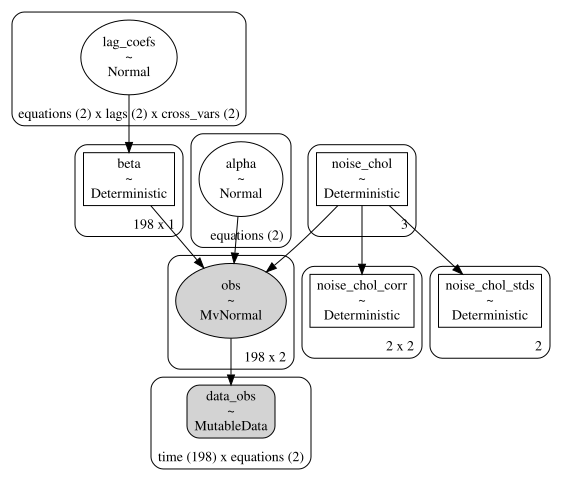

In [989]:
n_lags = 2
n_eqs = 2
model, _ = make_model(n_lags, n_eqs, df2)
pm.model_to_graphviz(model)

Another VAR with 2 lags and 3 equations. 

Sampling: [alpha, lag_coefs, noise_chol, obs]


  lag_coefs: shape=(3, 2, 3)
      alpha: shape=(3,)
noise_chol_cholesky-cov-packed__: shape=(6,)
 noise_chol: shape=(6,)


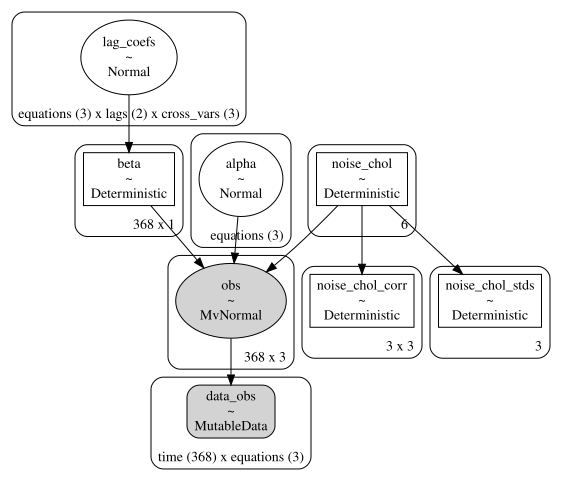

In [785]:
n_lags = 2
n_eqs = 3
model, _ = make_model(n_lags, n_eqs, df3)
for rv, shape in model.eval_rv_shapes().items():
    print(f"{rv:>11}: shape={shape}")
pm.model_to_graphviz(model)

Now we will fit the VAR with 2 lags and 2 equations

In [990]:
n_lags = 2
n_eqs = 2
model, idata_2 = make_model(n_lags, n_eqs, df2, prior_checks=False)


Sampling: [alpha, lag_coefs, noise_chol, obs]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [lag_coefs, alpha, noise_chol]
WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 663 seconds.


In [ ]:
def plot_ppc(idata, df, group='posterior_predictive'):
    fig, axs = plt.subplots(2, 1)
    axs = axs.flatten()
    ppc = az.extract_dataset(idata, group="prior_predictive", num_samples=100)["obs"]

    axs[0].plot(np.arange(ppc.shape[0]), ppc[:, 0, :], color='grey', alpha=0.2);
    axs[0].plot(np.arange(ppc.shape[0]), ppc[:, 0, :].mean(axis=1), color='cyan', label='Mean');
    axs[0].plot(df['x'], 'o', color='black', markersize=2, label='Observed')
    axs[0].set_title("VAR Series 1")
    axs[0].legend()
    axs[1].plot(np.arange(ppc.shape[0]), ppc[:, 1, :], color='grey', alpha=0.2);
    axs[1].plot(df['y'], 'o', color='black', markersize=2, label='Observed')
    axs[1].plot(np.arange(ppc.shape[0]), ppc[:, 1, :].mean(axis=1), color='cyan', label='Mean');
    axs[1].set_title("VAR Series 2")
    axs[1].legend()

In [993]:
az.summary(idata_2, var_names=['alpha', 'noise_chol_corr'])

/Users/nathanielforde/opt/miniconda3/envs/pymc_ar_ex/lib/python3.9/site-packages/arviz/stats/diagnostics.py:586: RuntimeWarning: invalid value encountered in double_scalars
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha[x],17.008,1.315,14.545,19.532,0.031,0.022,1786.0,2303.0,1.0
alpha[y],10.323,1.313,7.752,12.735,0.031,0.022,1810.0,2303.0,1.0
"noise_chol_corr[0, 0]",1.000,0.000,1.000,1.000,0.000,0.000,4000.0,4000.0,NaN
"noise_chol_corr[0, 1]",-0.211,0.069,-0.348,-0.090,0.001,0.001,3984.0,2982.0,1.0
"noise_chol_corr[1, 0]",-0.211,0.069,-0.348,-0.090,0.001,0.001,3984.0,2982.0,1.0
"noise_chol_corr[1, 1]",1.000,0.000,1.000,1.000,0.000,0.000,3636.0,4000.0,1.0


In [994]:
with model: 
    pm.sample_posterior_predictive(idata_2, extend_inferencedata=True, random_seed=rng)

Sampling: [obs]


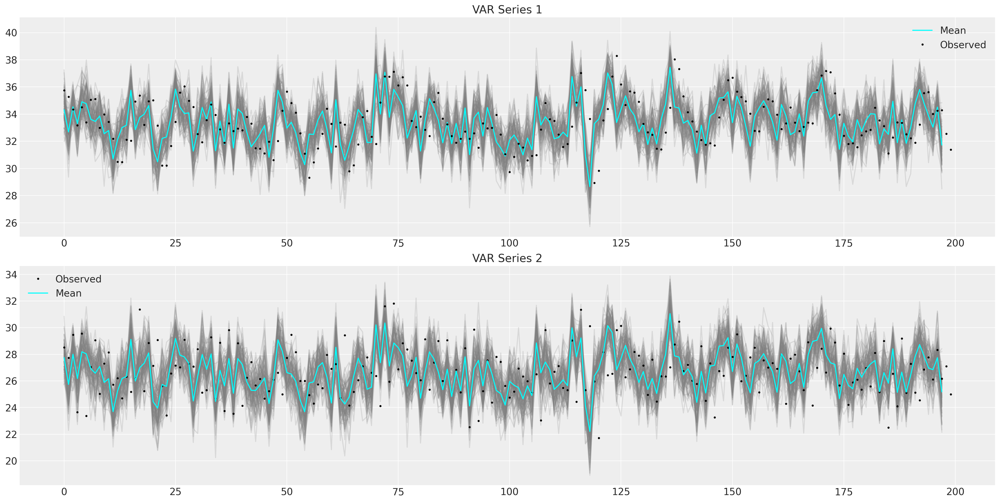

In [998]:
def plot_ppc(idata, df, group='posterior_predictive'):
    fig, axs = plt.subplots(2, 1, figsize=(20, 10))
    axs = axs.flatten()
    ppc = az.extract_dataset(idata, group=group, num_samples=100)["obs"]

    axs[0].plot(np.arange(ppc.shape[0]), ppc[:, 0, :], color='grey', alpha=0.2);
    axs[0].plot(np.arange(ppc.shape[0]), ppc[:, 0, :].mean(axis=1), color='cyan', label='Mean');
    axs[0].plot(df['x'], 'o', color='black', markersize=2, label='Observed')
    axs[0].set_title("VAR Series 1")
    axs[0].legend()
    axs[1].plot(np.arange(ppc.shape[0]), ppc[:, 1, :], color='grey', alpha=0.2);
    axs[1].plot(df['y'], 'o', color='black', markersize=2, label='Observed')
    axs[1].plot(np.arange(ppc.shape[0]), ppc[:, 1, :].mean(axis=1), color='cyan', label='Mean');
    axs[1].set_title("VAR Series 2")
    axs[1].legend()

plot_ppc(idata_2, df)

In [939]:
def make_hierarchical_model(n_lags, n_eqs, df, group_field, mv_norm=True, prior_checks=True):
    cols = [col for col in df.columns if col != group_field]
    coords={"lags": np.arange(n_lags) + 1,
            "equations": cols,
            "cross_vars": cols}

    groups = df[group_field].unique()

    with pm.Model(coords=coords) as model:
        rho = pm.Beta('rho', alpha=1, beta=1);
        alpha_hat_location = pm.Normal('alpha_hat_location', 0, .1);
        alpha_hat_scale = pm.InverseGamma('alpha_hat_scale', 3, 0.5);
        beta_hat_location = pm.Normal('beta_hat_location', 0, .1);
        beta_hat_scale = pm.InverseGamma('beta_hat_scale', 3, 0.5);
        omega_global, _, _ = pm.LKJCholeskyCov('omega_global', n=n_eqs, eta=1.0, sd_dist=pm.Exponential.dist(1))
  
        
        for grp in groups:
            df_grp = df[df[group_field] == grp][cols]
            z_scale_beta = pm.InverseGamma(f'z_scale_beta_{grp}', 3, 0.5)
            z_scale_alpha = pm.InverseGamma(f'z_scale_alpha_{grp}', 3, 0.5)
            lag_coefs = pm.Normal(f'lag_coefs_{grp}', mu=beta_hat_location, sigma=beta_hat_scale*z_scale_beta, dims=["equations", "lags", "cross_vars"]) #filters x rows x columns
            alpha = pm.Normal(f'alpha_{grp}', mu=alpha_hat_location, sigma=alpha_hat_scale*z_scale_alpha, dims=("equations",))


            beta = make_beta(lag_coefs, n_eqs, n_lags, df_grp)
            beta = pm.Deterministic(f'beta_{grp}', beta)
            mean = alpha + beta

            if mv_norm:
                n = df_grp.shape[1]
                noise_chol, _, _ = pm.LKJCholeskyCov(f'noise_chol_{grp}', eta=1.0, n=n, sd_dist=pm.Exponential.dist(1))
                omega = pm.Deterministic(f'omega_{grp}', rho*omega_global + 1-rho*noise_chol)
                obs = pm.MvNormal(f'obs_{grp}', mu=mean, chol=omega, observed=df_grp.values[n_lags:])
            else:
                sigma = pm.HalfNormal(f'noise_{grp}', sigma=1.0, dims=['equations'])
                obs = pm.Normal(f'obs_{grp}', mu=mean, sigma=sigma, observed=df_grp.values[n_lags:])
                    
        if prior_checks:
            idata = pm.sample_prior_predictive()
            return model, idata
        else: 
            idata = pm.sample_prior_predictive()
            idata.extend(pm.sample(target_accept=0.99, random_seed=100))
            pm.sample_posterior_predictive(idata, extend_inferencedata=True)
    return model, idata



Sampling: [alpha_Australia, alpha_Canada, alpha_Chile, alpha_Ireland, alpha_New Zealand, alpha_South Africa, alpha_United Kingdom, alpha_United States, alpha_hat_location, alpha_hat_scale, beta_hat_location, beta_hat_scale, lag_coefs_Australia, lag_coefs_Canada, lag_coefs_Chile, lag_coefs_Ireland, lag_coefs_New Zealand, lag_coefs_South Africa, lag_coefs_United Kingdom, lag_coefs_United States, noise_Australia, noise_Canada, noise_Chile, noise_Ireland, noise_New Zealand, noise_South Africa, noise_United Kingdom, noise_United States, obs_Australia, obs_Canada, obs_Chile, obs_Ireland, obs_New Zealand, obs_South Africa, obs_United Kingdom, obs_United States, omega_global, rho, z_scale_alpha_Australia, z_scale_alpha_Canada, z_scale_alpha_Chile, z_scale_alpha_Ireland, z_scale_alpha_New Zealand, z_scale_alpha_South Africa, z_scale_alpha_United Kingdom, z_scale_alpha_United States, z_scale_beta_Australia, z_scale_beta_Canada, z_scale_beta_Chile, z_scale_beta_Ireland, z_scale_beta_New Zealand, 

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3484 seconds.
The acceptance probability does not match the target. It is 0.9469, but should be close to 0.99. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.9704, but should be close to 0.99. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.9584, but should be close to 0.99. Try to increase the number of tuning steps.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
Sampling: [obs_Australia, obs_Canada, obs_Chile, obs_Ireland, obs_New Zealand, obs_South Africa, obs_United Kingdom, obs_United States]


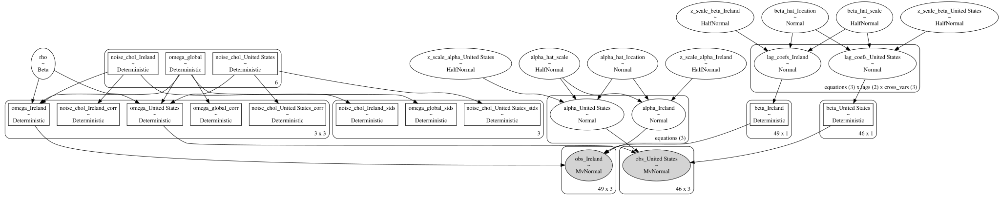

In [940]:
model_full_test, idata_full_test = make_hierarchical_model(2, 3, gdp_hierarchical[['country', 'dl_gdp', 'dl_cons', 'dl_gfcf']], 'country', mv_norm=False, prior_checks=False)
pm.model_to_graphviz(model_full)

In [944]:
with model_full_test:
    pm.sample_posterior_predictive(idata_full_test, extend_inferencedata=True, random_seed=rng)
    

Sampling: [obs_Australia, obs_Canada, obs_Chile, obs_Ireland, obs_New Zealand, obs_South Africa, obs_United Kingdom, obs_United States]


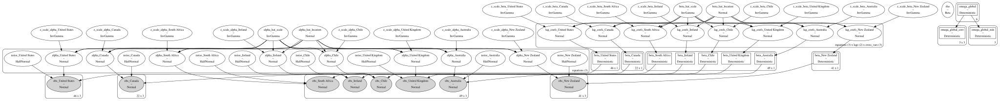

In [952]:
pm.model_to_graphviz(model_full_test)

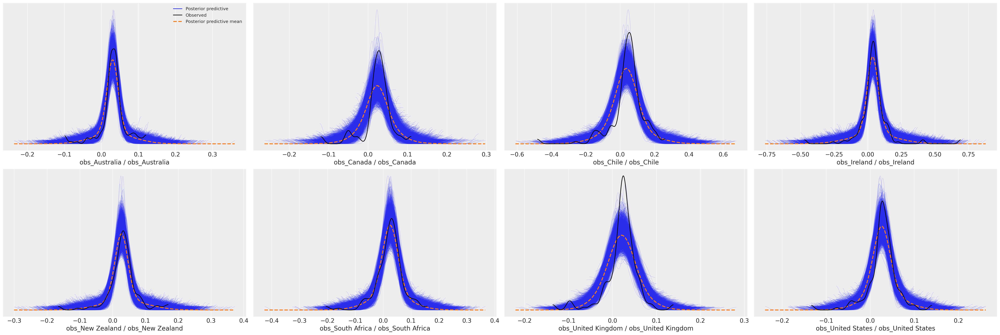

In [950]:
az.plot_ppc(idata_full_test);

In [951]:
az.summary(idata_full_test, var_names=['alpha_hat_location', 'alpha_hat_scale', 'beta_hat_location', 'beta_hat_scale'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha_hat_location,0.020,0.002,0.016,0.025,0.000,0.000,1375.0,1723.0,1.00
alpha_hat_scale,0.049,0.012,0.030,0.073,0.000,0.000,2160.0,2408.0,1.00
beta_hat_location,0.030,0.019,-0.004,0.065,0.001,0.000,766.0,785.0,1.00
beta_hat_scale,0.607,0.218,0.234,1.006,0.017,0.012,150.0,340.0,1.03


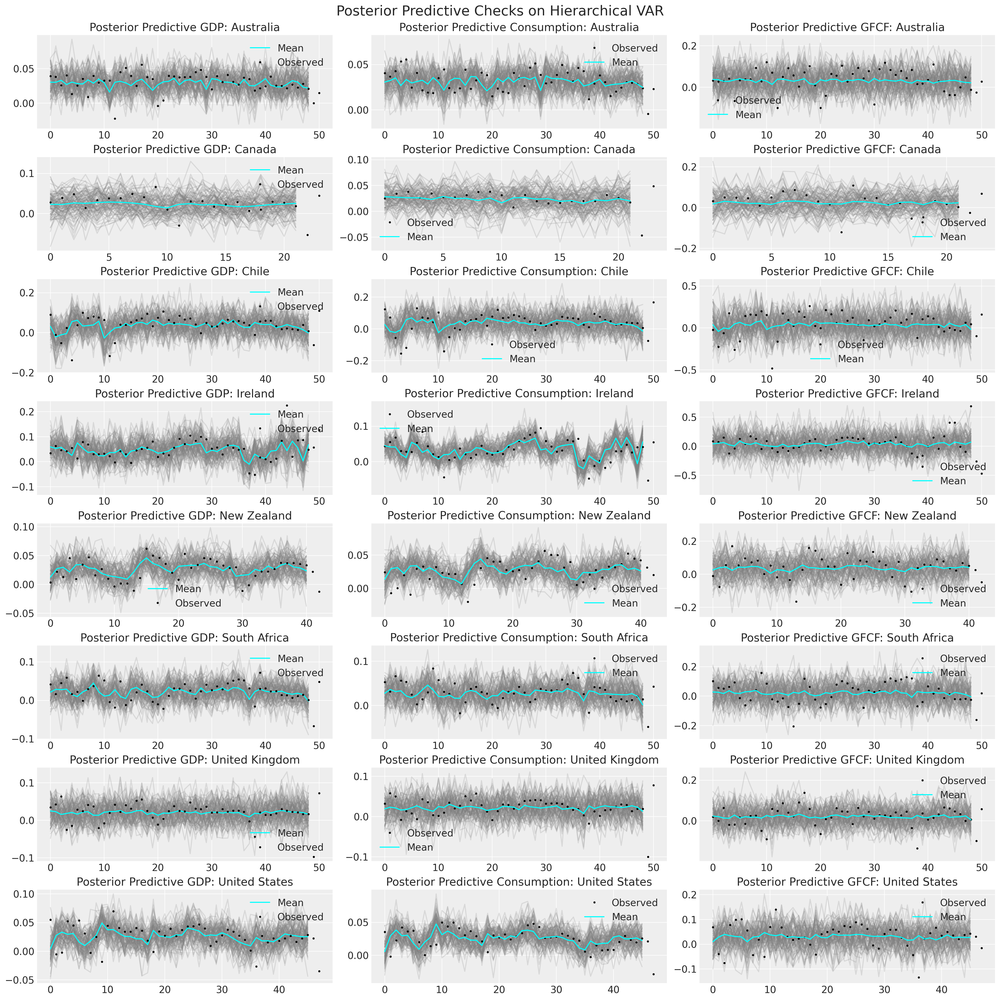

In [969]:
countries = gdp_hierarchical['country'].unique()
fig, axs = plt.subplots(8, 3, figsize=(20, 20))
for ax, country in zip(axs, countries):
    temp = gdp_hierarchical[gdp_hierarchical['country']== country].reset_index()
    ppc = az.extract_dataset(idata_full_test, group="posterior_predictive", num_samples=100)[f'obs_{country}']
    ax[0].plot(np.arange(ppc.shape[0]), ppc[:, 0, :], color='grey', alpha=0.2);
    ax[0].plot(np.arange(ppc.shape[0]), ppc[:, 0, :].mean(axis=1), color='cyan', label='Mean');
    ax[0].plot(temp['dl_gdp'], 'o', color='black', markersize=2, label='Observed')
    ax[0].set_title(f'Posterior Predictive GDP: {country}')
    ax[0].legend()
    ax[1].plot(np.arange(ppc.shape[0]), ppc[:, 1, :], color='grey', alpha=0.2);
    ax[1].plot(temp['dl_cons'], 'o', color='black', markersize=2, label='Observed')
    ax[1].plot(np.arange(ppc.shape[0]), ppc[:, 1, :].mean(axis=1), color='cyan', label='Mean');
    ax[1].set_title(f'Posterior Predictive Consumption: {country}')
    ax[1].legend()
    ax[2].plot(np.arange(ppc.shape[0]), ppc[:, 2, :], color='grey', alpha=0.2);
    ax[2].plot(temp['dl_gfcf'], 'o', color='black', markersize=2, label='Observed')
    ax[2].plot(np.arange(ppc.shape[0]), ppc[:, 2, :].mean(axis=1), color='cyan', label='Mean');
    ax[2].set_title(f'Posterior Predictive GFCF: {country}')
    ax[2].legend();
plt.suptitle("Posterior Predictive Checks on Hierarchical VAR", fontsize=20);
